<a href="https://colab.research.google.com/github/Munyiwamwangi/tajDjango/blob/master/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [116]:
# Unzip the data we uploaded to Google Drive
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/dog-breed-identification"

### Getting our workspace ready
* Import TensorFlow 2.x  # Build pipeline, and turns our data into tensors
* Import TensorFlow Hub  # This is where we will pick our model from
* make sure we are using a GPU

### Essential imports, TensorFlow, and TensorHub

In [117]:
# Import necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF.Version:", tf.__version__)
print(F"TF Hub.Version:", hub.__version__)

# Check for GPU availability
print("GPU available YESSSS!! " if tf.config.list_physical_devices("GPU") else "not available :(")

TF.Version: 2.18.0
TF Hub.Version: 0.16.1
GPU available YESSSS!! 


# 🐶 End-to-end Multi-Class Dog Breed Classification

This notrbook build end-to-end multi-class image classifier for dog breeds using TensorFlow 2.18.0 and Tensor Flow Hub.

## 1. Problem

Identifying the breed of a dog given it's image.

When I'm sitting at the cafe and I take a picture of a dog, I want to know the breed of the dog.

## 2. Data

The data we are using is from Kaggle Dog Breed Competition.

Data Link: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We are dealing with images so it's unstructured data. It's therefore best we use deep learning/ transfer learning.
* There are 120 dog breeds of dogs (this means we will have 120 classes/ dog classifications)
* There are 10,000+ records in training set (these images have labels)
* There are 10,000+ records in test set (these images have no labels sicne we will be predicting them)

### Getting our data ready (turning into tensors)

With all ML projects, our data must be in nimerical format, tensors are numerical representations of our images data

We start by checking the labels

In [118]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/dog-breed-identification/labels.csv")
print(len(labels_csv))
print(len(labels_csv["id"]))
print(labels_csv.describe())
print(labels_csv.head())

10222
10222
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [119]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [120]:
# How many Images are there of each breed
labels_csv['breed'].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


<Axes: xlabel='breed'>

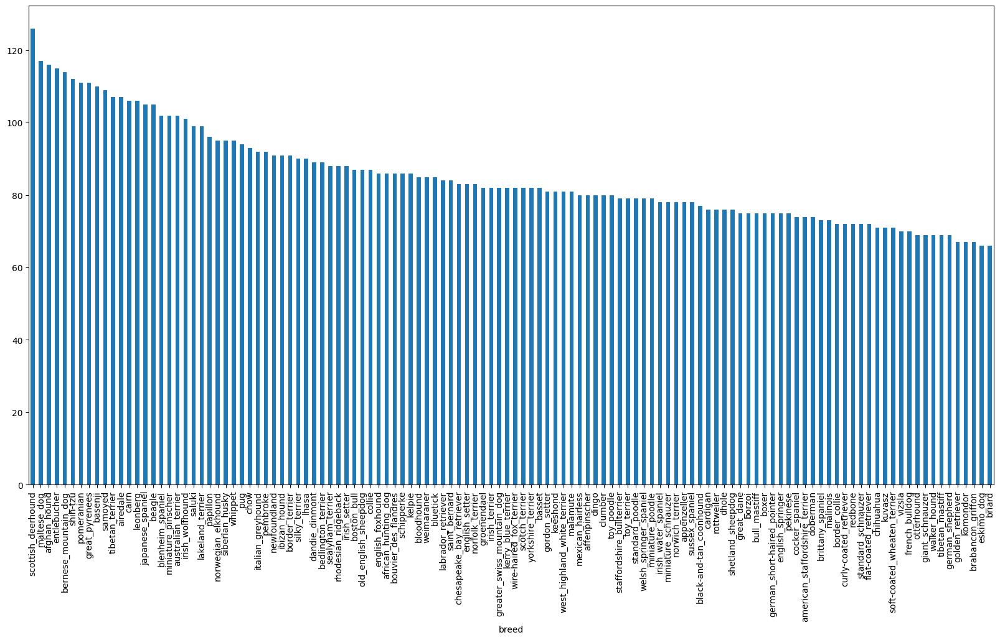

In [121]:
# Lets visualize it
labels_csv['breed'].value_counts().plot.bar(figsize = (20,10))

In [122]:
labels_csv['breed'].value_counts().median()

82.0

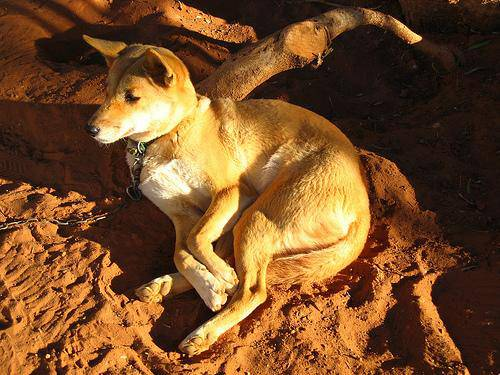

In [123]:
# Let's view an image in our data
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our images pathnames

In [124]:

# Create pathnames from image IDs
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [125]:
filenames  = ["drive/MyDrive/Dog Vision/dog-breed-identification/train/"+fname + ".jpg" for fname in labels_csv['id']]
filenames[:10]
# len(filenames)

['drive/MyDrive/Dog Vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [126]:
import os
# import shutil

files_number = os.listdir("/content/drive/MyDrive/Dog Vision/dog-breed-identification/train/")
len(files_number)

# shutil.rmtree("/content/drive/MyDrive/Dog Vision/dog-breed-identification")

10222

In [127]:
# Check whether number of filenames matches number of actual image files
if len(os.listdir("drive/MyDrive/Dog Vision/dog-breed-identification/train/")) == len(filenames):
  print("File names matches actual amount of files  !!, proceed.")
else:
  print("File names do not match actual amount of files, check the filename directory")

File names matches actual amount of files  !!, proceed.


In [128]:
labels_csv["breed"][9000]

'tibetan_mastiff'

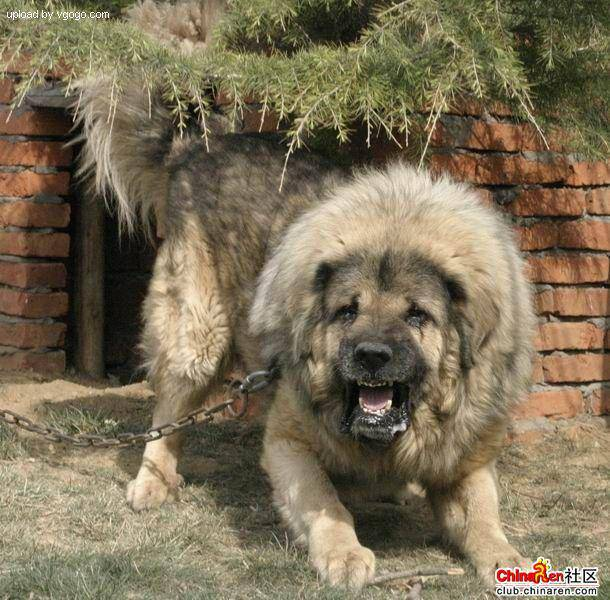

In [129]:
Image("drive/MyDrive/Dog Vision/dog-breed-identification/train/e20e32bf114141e20a1af854ca4d0ecc.jpg")

In [130]:
# After getting our image file paths in a list, lets prep the labels
# First we create them as a list
import numpy as np
labels = labels_csv['breed'].to_numpy()
print(len(labels))
labels[:10]

10222


array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [131]:
# Confirm if number of labels matches file numbers
if(len(labels) == len(labels_csv)):
  print('files matches in number with the labels')
else:
  print('Check file directory whether you imported everything')

files matches in number with the labels


In [132]:
# Find the unique label values
unique_breeds = np.unique(labels)
print(len(unique_breeds))
# unique_breeds

120


In [133]:
# Turn a single label into an array of booleans
# So in unique breeds, if our label is found, we show true, else false
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [134]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [135]:
# Example: Turning Boolean arrays into intergers
print(labels[0]) #cgeck original label
print(np.where(unique_breeds == labels[0])) #locate index where label appears
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #replace True with 1, False with 0

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [136]:
print((unique_breeds == labels[0]).astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [137]:
numerical_labels = [(label == unique_breeds).astype(int) for label in labels]

print(numerical_labels[:2])

[array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])]


### Creating our own validation set
 Since Kaggle doesn't come with a validation set, we create our own

In [138]:
# Setup X and y variables
X = filenames
y = boolean_labels

We are going to start experimenting with 1000 images, and increase as needed



In [139]:
# Set number of images for exparimenting
NUM_IMAGES = 1000 #@param{type:'slider', min:1000, max:10000, step:1000}

In [140]:
# We split the data into train and validation sets
from sklearn.model_selection import  train_test_split

# Split into training and validation of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [141]:
# Let's look at our training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/dog-breed-identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/dog-breed-identification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

#### Preprocessing images: turning images into Tensors
To pre-process our images into Tensors we are going to write a preprocessing function that does the following:

* Tame image file path as input
* Use TensorFlow to read the file and save it to a variable `image`
* Turn our `image` (a jpg) into Tensors
* Normalize our values by converting color channel values from 0 - 255 range to 0 - 1 range
* Resize the `image` into a standardized size (shape of 224, 224)
* Return the modified image

Before we do, lets see how an image is imported:

In [142]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

0 255


array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
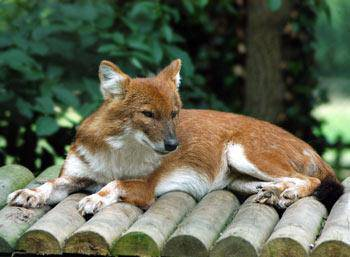

In [143]:
# The data below shows a mapped image.
# Every pixel in the image is recorded as a number
# it's rgb value ranges from 0 to 255
print( image.min(), image.max())
image

In [144]:
image[:2] #Array

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [145]:
# Turn image into a tensor which can run on a GPU.
# GPU can find patterns faster in the Tensors than our machines can in the Array above
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [146]:
# We have seen what an image looks like as a Tensor, lets create a function to process them:
IMG_SIZE = 224 # 224 aligns our image with the model, same data shape and size that was used to train the model.

def process_image(image_path, img_size=IMG_SIZE):
  '''
    Takes an image file path and turns the image into a Tensor
  '''
  # Read the image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical 8 unit Tensor with the 3 color channels (Red, Green, Blue (RGB))
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0 - 255 to 0 - 1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our designed value to (224, 224) which is an exact square
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

#### Turning our data into batches
**Why do we do this?** <br>
Lets say you are planning to process 10000+ images in one go, they might not all fit into memory, so we group them into batches of 32. This is obviously adjustable if need be, but 32 is recommended. <br>

In order for TensFlow to work properly, we need our data in form of Tensor Tupples which look like this: <br>

`(image, label)`

In [147]:
# Create a simple function to return a tupple of Tensors
def get_image_label(image_path, label):
  '''
    Takes an image path and the associated label,
    processes the image and returns a tuple of the (image, label)
  '''
  image  = process_image(image_path)
  return image, label


In [148]:
# Demo
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

#### Now we create a function to turn all the data into these tupples of (image, label)

In [149]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
    Creates batches of data out of images (X), and labels (y) pairs,
    Shuffles the data if its training data but doesn't shuffle if its validation data,
    Also accepts test data as input with no labels
  '''
  # If the data os test data set, we dont have labels
  if test_data:
    print('Creating test data-set batches ...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only file paths, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid data set, we do not need to shuffle it
  elif valid_data:
    print('Creating validation-data set batches ...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

    # Create training data-set batches
  else:
    print('Creating training-data set batches ...')
    # Turn file paths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                               tf.constant(y))) #labels
    # Shuflling pathnames and labels before mapping, image processor function is faster than shuffling images
    # we shuffle before processing because shuffling file paths is waay easier and time saving than Tensor transformed images
    data = data.shuffle(buffer_size=len(X))

    #Create our tupples here, this also turns the image paths intp preprocessed images, then batch
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)

  return data_batch

In [150]:
# Create training and validation batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training-data set batches ...
Creating validation-data set batches ...


In [151]:
# Check out different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

Our data is now in batches, but these can be a little hard to comprehend,
so lets visualize them

In [152]:
import matplotlib.pyplot as plt

# Create afunctio to visualize the images in a data batch
def show_25_images(images, labels):
  """
  Displays aplot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5 , 5,  i+1)
    # Display image
    plt.imshow(images[i])
    # Add the image label as the title, refer below for y[0].argmax() returns the label where True/ 1 is positioned
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the axis off
    plt.axis("off")

In [153]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [154]:
# Our train and valid data is a batch, but we need to make it iterable,
# next() takes the first batch of the data
train_images, train_labels = next(train_data.as_numpy_iterator())

# check size
print(len(train_images), len(train_labels))
# Lets see the unpacked data
train_images, train_labels

32 32


(array([[[[6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          ...,
          [8.86334181e-01, 5.75777709e-01, 5.08358538e-01],
          [7.95104325e-01, 6.10808671e-01, 5.64208806e-01],
          [6.52769864e-01, 6.39307380e-01, 6.25304103e-01]],
 
         [[6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          ...,
          [9.33752358e-01, 6.15238369e-01, 5.38994730e-01],
          [7.69212008e-01, 5.67281187e-01, 5.09243369e-01],
          [5.61781228e-01, 5.16401410e-01, 4.84789312e-01]],
 
         [[6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          [6.98039234e-01, 8.07843208e-01, 8.62745166e-01],
          ...,
          [9.76505458e-01, 6.55611992e-01, 5.6974

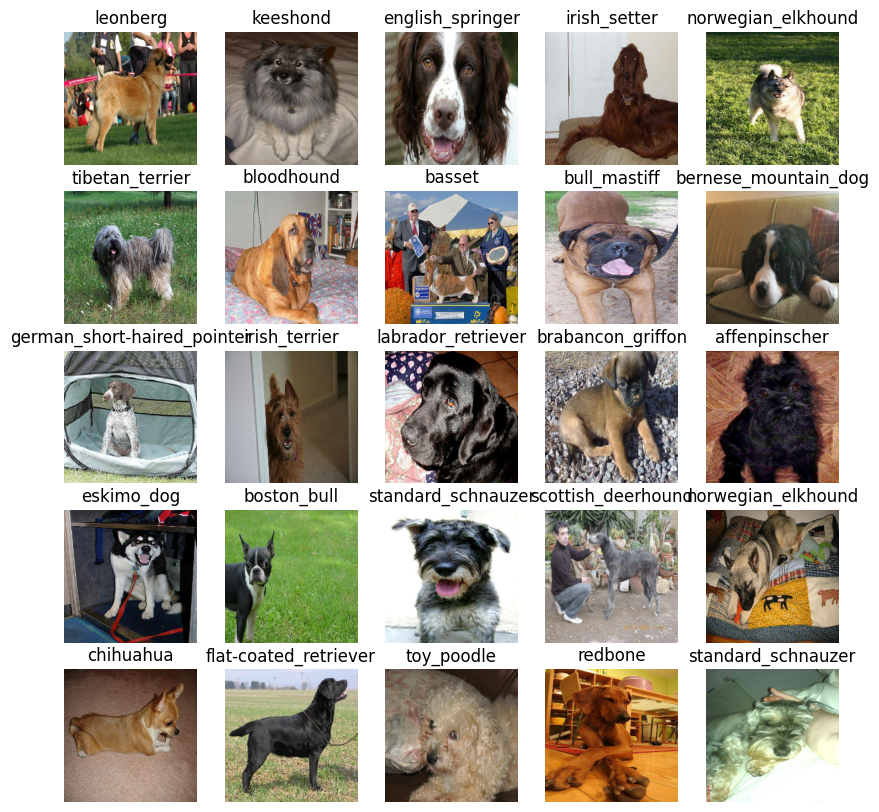

In [155]:
# Now lets visualize the data in the training batch
show_25_images(train_images, train_labels)

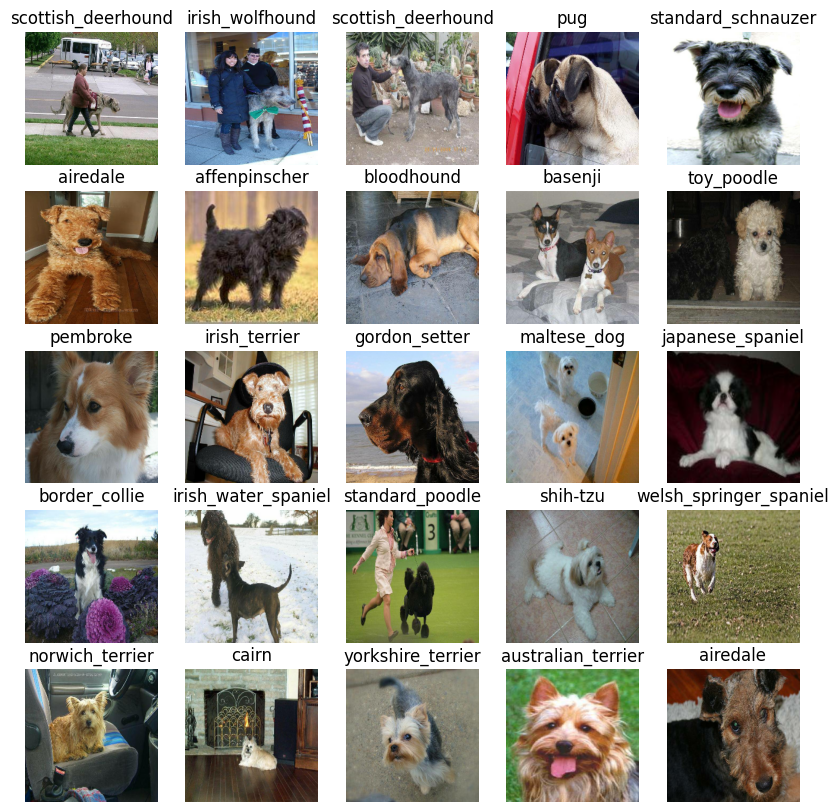

In [156]:
# Now lets visualize validation set
val_images, val_labels = next(train_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Creating a model
Before we build a model there are things we need to define:
1. The input shape (our images shape in form of tensors) to our model.
2. The output shape (image labels in the form of tensors) of our model.
3. The URl of the model we want to use : https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true

In [157]:
IMG_SIZE

224

In [158]:
# Setup input shape to the model
# INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, color channels
INPUT_SHAPE = [IMG_SIZE, IMG_SIZE, 3] # height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensor Flow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"  # Use a feature extractor model


Now we have our input and output and model ready to go,  
lets put them together intoa keras deep learning model

Knowing this, lets create a function which:
* takes the INPUT_SHAPE, OUTPUT_SHAPE and the MODEL_URL we have chosen as the parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that, tells the model it's input and output shape)
* Compiles the model, says how it should be evaluated ans improved.
* Builds the model
* Returns the model

In [159]:
INPUT_SHAPE

[224, 224, 3]

In [160]:
OUTPUT_SHAPE

120

In [161]:
# def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
#     print("Building model with:", model_url)

#     mobile_net = hub.KerasLayer(model_url)  # Load model

#     # Setup the model layers
#     model = tf.keras.Sequential([
#         tf.keras.layers.InputLayer(shape=INPUT_SHAPE),  # Ensure correct input shape
#         tf.keras.layers.Lambda(lambda x: mobile_net(x)),  # Apply the pre-trained model
#         tf.keras.layers.Dense(OUTPUT_SHAPE, activation='softmax')  # Output layer
#     ])

#     # Compile model
#     model.compile(
#         loss=tf.keras.losses.CategoricalCrossentropy(),
#         optimizer=tf.keras.optimizers.Adam(),
#         metrics=["accuracy"]
#     )

#     return model

from tensorflow.keras.saving import register_keras_serializable

class HubKerasLayer(tf.keras.layers.Layer):
    def __init__(self, model_url, **kwargs):
        super(HubKerasLayer, self).__init__(**kwargs)
        self.model_url = model_url
        self.hub_layer = hub.KerasLayer(self.model_url, trainable=False)

    def build(self, input_shape):
        # No need for build in this case
        pass

    def call(self, inputs):
        return self.hub_layer(inputs)

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=input_shape),  # Ensure correct input shape
        HubKerasLayer(model_url=model_url),  # Add the custom layer
        tf.keras.layers.Dense(output_shape, activation='softmax')  # Output layer
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model


# Example usage
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ hub_keras_layer_3 (HubKerasLayer)    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 120)                 │         153,720 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 153,720 (600.47 KB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 0 (0.00 B)

#### Creating callbacks
Callbacks are helper functions a model can use during training to do things such as save a models progress,
check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

**To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do 3 things:**
1. Load the TensorBoard notebook extension for visualizing model logs.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize the our models training logs using the `%tensorboard` magic function (we'll do this later on).

In [162]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [163]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early stopping markdown
Stop training when a monitored metric has stopped improving hence stopping overfitting where a model can become very good at learning patterns for a certain data set untill its unable to predict accurately.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [164]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

#### Training a model (on a subset of the data)
Our first model is only going to train on 1000 images to make sure everything is working.

NUM_EPOCHS is a variable typically used to define the number of times a deep learning model will go through the entire training dataset during training.

Epoch: One full pass of the training data through the model.

More epochs → The model trains for a longer time and learns more patterns.

Fewer epochs → The model may not learn enough (underfitting).


In [165]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [166]:
# Confirm we are still running a GPU
print("GPU available YESSS !!! " if tf.config.list_physical_devices("GPU") else "Not Available")

GPU available YESSS !!! 


#### Lets create a function which trains a model
* Create a model using `create_model`
* Setup TensorBoard callback using the function `create_tensorboard_callback`
* Call the `fit()` function on our model, passing trainng data, validation data, and number of NUM_EPOCHS, and the callbacks we would like to use
* Return the model

In [167]:
def train_model():
  """
  Trains a given model, returns a trained model
  """
  # Create a model
  model = create_model()

  # Create a new Tensorboard session every time we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data, passing the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [168]:
model=train_model()
print('Model trained successfully. ')

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 136s 5s/step - accuracy: 0.0633 - loss: 4.6991 - val_accuracy: 0.3350 - val_loss: 3.2191
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 15s 180ms/step - accuracy: 0.6650 - loss: 2.0285 - val_accuracy: 0.5600 - val_loss: 2.0663
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - accuracy: 0.9251 - loss: 0.7974 - val_accuracy: 0.6250 - val_loss: 1.6223
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - accuracy: 0.9834 - loss: 0.4115 - val_accuracy: 0.6300 - val_loss: 1.4245
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 7s 199ms/step - accuracy: 0.9950 - loss: 0.2452 - val_accuracy: 0.6550 - val_loss: 1.3189
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - accuracy: 0.9977 - loss: 0.1715 - val_accuracy: 0.6500 - val_loss: 1.2925
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 140ms/step - accuracy: 0.9975 - loss: 0.1272 - val_accuracy: 0.6700 - val_loss: 1.2402
Epoc

####**Question:**
Seems our model is overfitting because it's performing far better on the training dataset than the validation dataset.
What are some ways to prevent pverfitting in deeplearning neral networks.

Overfitting to being with is good because it means the model is learning. But it should be tamed.

**How to counter this or train the model better:**

1. Increase Training Data (Data Augmentation)
If you have limited data, try data augmentation to create variations of existing data.
For images, use techniques like rotation, flipping, cropping, and brightness adjustments (tf.keras.preprocessing.image.ImageDataGenerator or tf.keras.layers.RandomFlip).
2. Use Regularization Techniques
L1 and L2 Regularization (Weight Decay):
Add kernel_regularizer=tf.keras.regularizers.l2(0.01) to your layers.
Dropout Layers:
Randomly drops a fraction of neurons (tf.keras.layers.Dropout(0.5)).
Batch Normalization:
Helps stabilize training (tf.keras.layers.BatchNormalization()).
3. Reduce Model Complexity
Use fewer layers or neurons per layer.
Choose a simpler architecture if your dataset is small.
4. Use Early Stopping
Stop training when the validation loss starts increasing (tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)).
5. Use Transfer Learning Instead of Training from Scratch
Pre-trained models like MobileNet, ResNet, EfficientNet generalize better.
Freeze initial layers and only train the last few layers.
6. Improve Validation Strategy
Use cross-validation to ensure the model generalizes well.
Ensure train-test splits are balanced and representative.
7. Reduce Learning Rate
A high learning rate may cause overfitting. Use a learning rate scheduler (tf.keras.callbacks.ReduceLROnPlateau).

#### Checking the tensor board logs:
The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents

In [169]:
%tensorboard --logdir 'drive/MyDrive/Dog Vision/dog-breed-identification/logs'

Reusing TensorBoard on port 6006 (pid 10506), started 0:40:40 ago. (Use '!kill 10506' to kill it.)

<IPython.core.display.Javascript object>

#### Making and evaluating predictions using our trained model


In [170]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [171]:
# Make predictions on the validation data
predictions = model.predict(valid_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 6s 640ms/step


array([[1.24166906e-03, 1.17615727e-03, 8.81782791e-04, ...,
        1.44690988e-04, 1.23770791e-04, 4.76836413e-03],
       [1.45858224e-03, 6.29402697e-03, 6.56519411e-03, ...,
        5.44756942e-04, 9.79045988e-04, 8.18512417e-05],
       [2.93397989e-05, 1.33378431e-03, 1.02740414e-04, ...,
        4.51779837e-04, 1.05795116e-04, 8.48482712e-04],
       ...,
       [8.69218056e-05, 1.21192897e-04, 3.10419091e-05, ...,
        1.02011538e-04, 7.08908265e-05, 1.28834567e-04],
       [2.18270026e-04, 5.26620024e-05, 7.41460171e-05, ...,
        1.25807001e-05, 6.73143732e-05, 1.90038932e-03],
       [1.18897355e-04, 3.90359273e-05, 1.00678683e-03, ...,
        1.91611541e-03, 1.51768222e-03, 5.81119675e-04]], dtype=float32)

In [172]:
predictions.shape
# showing that we have 200 dogs to classify into 120 classes

(200, 120)

In [173]:
# So whats happpening here is that the model checks, what are the chances that this dog[0] is in this first class.
# Then that's written as a probability, that means that the highest probability in the array is the best/right prediction for the dog class
predictions[0]

array([1.24166906e-03, 1.17615727e-03, 8.81782791e-04, 3.33882635e-04,
       1.79932930e-03, 1.07093343e-04, 9.65048745e-03, 1.75512535e-03,
       6.37196121e-04, 2.68096599e-04, 3.76371201e-04, 1.34275077e-04,
       3.28924245e-04, 2.49936238e-05, 2.68948817e-04, 7.79031892e-04,
       1.65691945e-05, 8.64988491e-02, 6.71483212e-05, 1.05749015e-04,
       1.76857796e-03, 1.04541471e-03, 8.20936184e-05, 1.34881691e-03,
       1.90123155e-05, 3.52996431e-05, 1.37895137e-01, 4.15834074e-04,
       9.37628443e-04, 1.02495903e-03, 4.17884236e-04, 1.22890146e-02,
       3.90349887e-04, 3.40507511e-04, 5.63205649e-05, 2.39205416e-02,
       2.84118869e-04, 5.81001979e-04, 2.32776547e-05, 8.94382028e-05,
       1.73760869e-04, 1.64184821e-04, 7.72895692e-06, 1.50516236e-04,
       1.49424697e-04, 7.54510751e-04, 1.35459908e-04, 1.20881340e-03,
       2.28732417e-04, 1.06831794e-04, 3.07120317e-05, 9.10893548e-04,
       1.78477180e-03, 1.13181362e-03, 7.96623590e-06, 4.12918671e-05,
      

This functionality is great but we want to be able to scale it
And it would be better to see the image being predicted
**Note** Prediction probabilities are also known as confident levels.

In [174]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[9])
pred_label

'collie'

In [175]:
# top 10 pred
# top_10_pred_indexes = pred_prob.argsort()[-10:][::-10]

# top 10 prediction values
# tp_10_pred_values = pred_prob(top_10_pred_indexes)

In [176]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Since our validation data is in batch dataset as visible above; we did this because it makes it easier for tensorflow to work on the data,
we want o unbatch it using the following function. We are done training after all, for now at least

In [177]:
# Lets do a function for unbatchifying

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
# test check
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [178]:
get_pred_label(predictions[0])

'maltese_dog'

Now we have ways to get the:
* Prediction labels
* Validation labels (truth tables)
* Validation images
Lets create a function to make all these more visual

**We create a function that :**
* Takes an array of prediction probabilities, array of truth labels and, an array of images and intergers.
* Convert the prediction probabilities to a predicted label/pick the highest probability which is the most confident prediction (It's like the model saying, I'm pretty 70% sure that this dog is this breed), so we pick the highest
* Plot the predicted label, its predicted probability, the truth label and the target image in a single plot.

In [179]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n/ nth sample
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

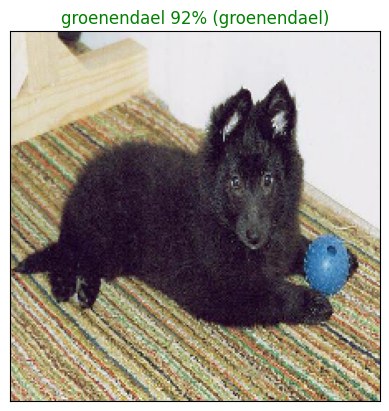

In [180]:
plot_pred(prediction_probabilities=predictions,
          labels = val_labels,
          images = val_images,
          n = 77)

Now we've got one function to visualize our models top prediction,
let's create another one to visualize top 10 predictions

The function will:
* Take an input of prediction probailities, array of ground truth and an interger.
* Find the predictions using `get_preds_label()`
* Find top 10 prediction probablity values and top 10 probablity labels.

Plot the top 10 values and labels?

In [181]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]


  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

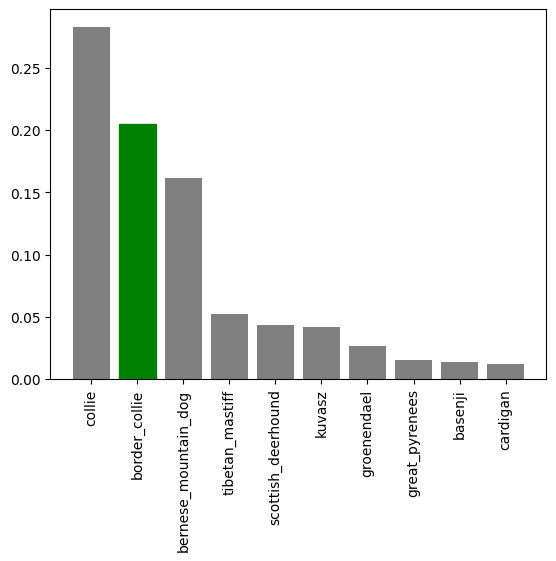

In [182]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [183]:
predictions[0].argsort() #gives us indices that can help us order the array and pick top 10

array([ 99,  42,  54,  16,  24,  38,  13,  91,  50,  25,  67,  58,  55,
       107,  34,  86,  78,  63,  90,  18,  56,  72,  85,  22,  61,  39,
        69, 112, 105,  19,  49,   5, 108, 118,  71,  11,  46, 117,  44,
        43,  84, 113,  41,  40,  88,  95,  89, 111, 101,  48,   9,  14,
       114,  64,  36, 115,  66,  12,   3,  33,  10,  32,  92,  27,  30,
        94,  87, 104,  62,  37,   8,  75,  45,  15,  96,   2,  51,  28,
        29,  21,  53,  60,   1,  47,   0,  23,   7,  20,  52,   4,  93,
        98,  80,  74, 119,  57, 106,  97,  82,  83,   6,  65,  77, 102,
        31, 100,  76,  81,  68, 109, 110,  59,  35, 116,  79,  17, 103,
        70,  26,  73])

In [184]:
# Top 10 values of predictions[0]
predictions[0].argsort()[-10:][::-1]

array([ 73,  26,  70, 103,  17,  79, 116,  35,  59, 110])

In [185]:
predictions[0].max()

0.15628953

Now that we've got some function to help us visualize our model, let's check out afew.
Lets check out a few predictions and their values

The image and the label on top is what our model predicted, while the actual true label is what's shown in the prediction plot in green.

The percentages in the title is the models confidence level.

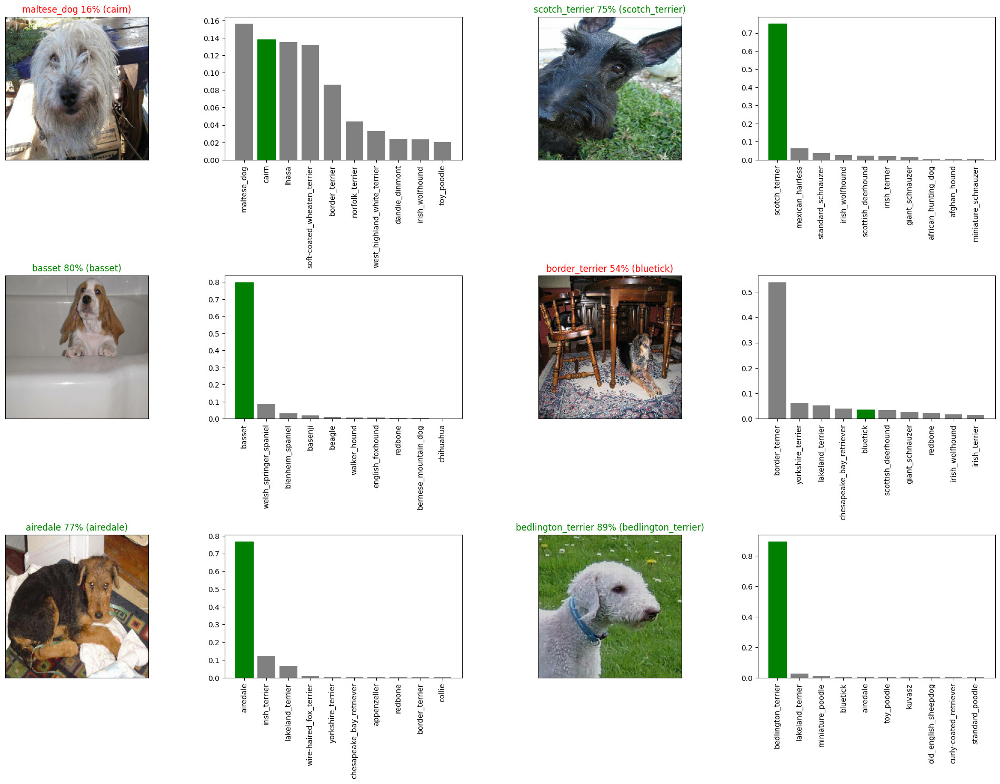

In [186]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i+i_multiplier)
plt.tight_layout()
plt.show()

**CHALLENGE:** How would you create a confusion matrix wit our models predictions and true labels

### Saving and reloading a trained model
TensorFlow now prefers saving models in the native Keras format instead of .h5 because it better supports newer layers like hub.KerasLayer.

In [187]:
# Create a function to save a model
def save_model(model, suffix=None):
    '''
    Saves a given model in a model directory with an optional suffix.
    '''
    import os
    import datetime

    # Create a directory path with timestamp
    modeldir = os.path.join(
        'drive/MyDrive/Dog Vision/dog-breed-identification/models/',
        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    )

    os.makedirs(modeldir, exist_ok=True)  # Ensure directory exists

    # Define model save path with `.keras` format
    model_path = os.path.join(modeldir, f"{suffix}.keras")
    print(f"Saving model to: {model_path} ...")

    # Save in Keras format (recommended)
    model.save(model_path)
    return model_path

In [188]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  # model = tf.keras.models.load_model(model_path,
  #                                    custom_objects={"KerasLayer":hub.KerasLayer})

  model = tf.keras.models.load_model(model_path,
                                   custom_objects={"HubKerasLayer": HubKerasLayer, "KerasLayer": hub.KerasLayer})
  return model

Now we have functions to save and load model, lets make sure they work

In [189]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-090432/1000-images-mobilenetV2-Adam.keras ...


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-090432/1000-images-mobilenetV2-Adam.keras'

In [191]:
# Load our trained model
path = 'drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-090432/1000-images-mobilenetV2-Adam.keras'
# loaded_1000_trained_model = tf.keras.models.load_model(path)
loaded_1000_trained_model = load_model(path)

Loading saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-090432/1000-images-mobilenetV2-Adam.keras


In [192]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 105ms/step - accuracy: 0.6905 - loss: 1.1090


[1.1885771751403809, 0.6700000166893005]

In [193]:
# Evaluate the loaded model
loaded_1000_trained_model.evaluate(valid_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 5s 322ms/step - accuracy: 0.6905 - loss: 1.1090


[1.1885771751403809, 0.6700000166893005]

### Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [194]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

#### Batchify the data
Now We've got over 10,000 images and labels in our training set.

Before we can train a model on these, we'll have to turn them into a data batch.

The beautiful thing is, we can use our `create_data_batches()` function from above which also preprocesses our images for us

In [195]:
# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training-data set batches ...


#### Create the model trained on full image data
Our data is in a data batch, all we need now is a model.

And surprise, we've got a function for that too! Let's use `create_model()` to instantiate another model.

In [196]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


#### Create full model callbacks

In [197]:
# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

#### Train our full model
**Note:** Since running the cell below will cause the model to train on all of the data (10,000+) images, it may take a fairly long time to get started and finish. However, thanks to our `full_model_early_stopping` callback, it'll stop before it starts going too long.

Remember, the first epoch is always the longest as data gets loaded into memory. After it's there, it'll speed up.

In [198]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

# Save model to file
save_model(full_model, suffix="all-images-Adam")
print('Model trained and saved successfully ...')

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 53s 145ms/step - accuracy: 0.4951 - loss: 2.3536
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 74s 125ms/step - accuracy: 0.8853 - loss: 0.4234
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - accuracy: 0.9366 - loss: 0.2602
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 131ms/step - accuracy: 0.9647 - loss: 0.1763
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 130ms/step - accuracy: 0.9832 - loss: 0.1180
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 130ms/step - accuracy: 0.9893 - loss: 0.0894
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 129ms/step - accuracy: 0.9951 - loss: 0.0664
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 127ms/step - accuracy: 0.9967 - loss: 0.0521
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - accuracy: 0.9972 - loss: 0.0437
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 130ms/step - accuracy: 0.9980 - loss: 0.0350
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 83s 132ms/step - accuracy: 0.9983 - loss: 0.0302
Epoch 12

#### Saving and reloading the full model

Even on a GPU, our full model took a while to train. So it's a good idea to save it.

We can do so using our `save_model()` function.

**Challenge:** It may be a good idea to incorporate the `save_model()` function into a `train_model()` function.

In [199]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-092857/all-images-Adam.keras ...


'drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-092857/all-images-Adam.keras'

In [204]:
# Load in the full model
path='drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-092857/all-images-Adam.keras'
loaded_full_model = load_model(path)

Loading saved model from: drive/MyDrive/Dog Vision/dog-breed-identification/models/20250207-092857/all-images-Adam.keras


#### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [205]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/dog-breed-identification/test/e4c49d7e028965d3504b0862633464c3.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e3d417026b89cbb57b00a7208421009d.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e22d81ccf32bd590d8dd66815fd222b7.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/df621265607ba0285bd79705eb3541e0.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e30a97eb637239e3b15c903529e04800.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e0a21cb0d8d3014b6c56230350a9362f.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e24b2d063b3ad699d5eba7a01e4ae956.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e4c743b9aaf615dd5fe162bf25f82fb5.jpg',
 'drive/MyDrive/Dog Vision/dog-breed-identification/test/e7e9624f2a2e61ab187358f5968bfde8.jpg']

In [206]:
# How many test images are there?
len(test_filenames)

10357

In [207]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data-set batches ...


**Note:** Since there are 10,000+ test images, making predictions could take a while, even on a GPU. So beware running the cell below may take up to an hour.

In [208]:
# Make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data,
                                             verbose=1)
test_predictions

324/324 ━━━━━━━━━━━━━━━━━━━━ 172s 524ms/step


array([[1.02911116e-07, 1.16348792e-10, 6.36337538e-10, ...,
        1.48731560e-09, 5.53161770e-12, 6.00344538e-06],
       [2.86461810e-09, 5.17274279e-11, 6.12962944e-11, ...,
        1.16501397e-09, 1.88314600e-10, 1.18081850e-10],
       [1.26626274e-08, 6.45768232e-05, 5.74710384e-07, ...,
        3.11661097e-07, 7.21551530e-08, 2.30809974e-07],
       ...,
       [3.65938504e-05, 7.95221400e-09, 4.55829706e-07, ...,
        6.72727310e-06, 3.58280765e-08, 1.99827459e-03],
       [1.14645331e-07, 5.17731982e-14, 6.71381353e-11, ...,
        6.76887799e-13, 1.10325350e-13, 6.12517524e-13],
       [3.51338468e-12, 1.54988310e-14, 1.61518316e-11, ...,
        2.37118658e-10, 2.52058346e-10, 3.96278409e-12]], dtype=float32)

In [209]:
# Make predictions on test data batch using the loaded full model
loaded_full_model_test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)
loaded_full_model_test_predictions

324/324 ━━━━━━━━━━━━━━━━━━━━ 46s 134ms/step


array([[1.02911116e-07, 1.16348792e-10, 6.36337538e-10, ...,
        1.48731560e-09, 5.53161770e-12, 6.00344538e-06],
       [2.86461810e-09, 5.17274279e-11, 6.12962944e-11, ...,
        1.16501397e-09, 1.88314600e-10, 1.18081850e-10],
       [1.26626274e-08, 6.45768232e-05, 5.74710384e-07, ...,
        3.11661097e-07, 7.21551530e-08, 2.30809974e-07],
       ...,
       [3.65938504e-05, 7.95221400e-09, 4.55829706e-07, ...,
        6.72727310e-06, 3.58280765e-08, 1.99827459e-03],
       [1.14645331e-07, 5.17731982e-14, 6.71381353e-11, ...,
        6.76887799e-13, 1.10325350e-13, 6.12517524e-13],
       [3.51338468e-12, 1.54988310e-14, 1.61518316e-11, ...,
        2.37118658e-10, 2.52058346e-10, 3.96278409e-12]], dtype=float32)

In [210]:
print("Original : ",test_predictions)
print("Saved and Loaded : ",loaded_full_model_test_predictions)

Original :  [[1.02911116e-07 1.16348792e-10 6.36337538e-10 ... 1.48731560e-09
  5.53161770e-12 6.00344538e-06]
 [2.86461810e-09 5.17274279e-11 6.12962944e-11 ... 1.16501397e-09
  1.88314600e-10 1.18081850e-10]
 [1.26626274e-08 6.45768232e-05 5.74710384e-07 ... 3.11661097e-07
  7.21551530e-08 2.30809974e-07]
 ...
 [3.65938504e-05 7.95221400e-09 4.55829706e-07 ... 6.72727310e-06
  3.58280765e-08 1.99827459e-03]
 [1.14645331e-07 5.17731982e-14 6.71381353e-11 ... 6.76887799e-13
  1.10325350e-13 6.12517524e-13]
 [3.51338468e-12 1.54988310e-14 1.61518316e-11 ... 2.37118658e-10
  2.52058346e-10 3.96278409e-12]]
Saved and Loaded :  [[1.02911116e-07 1.16348792e-10 6.36337538e-10 ... 1.48731560e-09
  5.53161770e-12 6.00344538e-06]
 [2.86461810e-09 5.17274279e-11 6.12962944e-11 ... 1.16501397e-09
  1.88314600e-10 1.18081850e-10]
 [1.26626274e-08 6.45768232e-05 5.74710384e-07 ... 3.11661097e-07
  7.21551530e-08 2.30809974e-07]
 ...
 [3.65938504e-05 7.95221400e-09 4.55829706e-07 ... 6.72727310e-06


In [211]:
# Check out the test predictions
test_predictions[:10]

array([[1.02911116e-07, 1.16348792e-10, 6.36337538e-10, ...,
        1.48731560e-09, 5.53161770e-12, 6.00344538e-06],
       [2.86461810e-09, 5.17274279e-11, 6.12962944e-11, ...,
        1.16501397e-09, 1.88314600e-10, 1.18081850e-10],
       [1.26626274e-08, 6.45768232e-05, 5.74710384e-07, ...,
        3.11661097e-07, 7.21551530e-08, 2.30809974e-07],
       ...,
       [7.87572674e-08, 5.48578249e-08, 5.81839501e-08, ...,
        2.78314843e-07, 2.47608583e-08, 2.41413556e-09],
       [3.24051680e-12, 2.36828179e-12, 8.30042686e-13, ...,
        6.10173412e-10, 9.99995828e-01, 6.15518785e-14],
       [5.60418778e-09, 1.96041516e-09, 3.36048522e-09, ...,
        1.49426540e-07, 5.84562310e-09, 1.71736980e-09]], dtype=float32)

### Preparing test dataset predictions for Kaggle

Looking at the [Kaggle sample submission](https://www.kaggle.com/c/dog-breed-identification/overview/evaluation), it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:
*   Create a pandas DataFrame with an ID column as well as a column for each dog breed.
*   Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the `unique_breeds` list and the `test_predictions` list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [212]:
# Create pandas DataFrame with empty columns, so we add create a dataframe with unique dog breeds and add the id as first column
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [213]:
# Append test image ID's to predictions DataFrame
test_path = "drive/MyDrive/Dog Vision/dog-breed-identification/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4c49d7e028965d3504b0862633464c3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e2166bdff9e35f80aa7984ec64c8cce8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e3d417026b89cbb57b00a7208421009d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e22d81ccf32bd590d8dd66815fd222b7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,df621265607ba0285bd79705eb3541e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [214]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4c49d7e028965d3504b0862633464c3,1.029111e-07,1.163488e-10,6.363375e-10,4.428876e-13,3.808483e-09,4.567484e-10,2.993488e-10,6.900754e-10,1.196194e-12,...,1.567877e-03,4.824248e-12,7.008263e-10,1.140266e-13,1.988654e-09,5.072362e-12,2.510011e-08,1.487316e-09,5.531618e-12,6.003445e-06
1,e2166bdff9e35f80aa7984ec64c8cce8,2.864618e-09,5.172743e-11,6.129629e-11,7.548925e-11,2.159465e-11,4.284061e-08,7.347027e-08,2.251085e-10,4.571590e-06,...,7.246616e-11,1.110156e-12,2.116646e-08,3.142737e-09,4.331049e-11,9.985923e-01,1.414569e-09,1.165014e-09,1.883146e-10,1.180818e-10
2,e3d417026b89cbb57b00a7208421009d,1.266263e-08,6.457682e-05,5.747104e-07,8.106293e-09,1.808275e-09,1.741111e-07,1.011132e-09,7.012071e-08,1.230968e-07,...,3.782248e-10,2.496047e-08,5.753611e-08,2.347422e-06,1.174703e-07,4.343128e-08,3.084912e-08,3.116611e-07,7.215515e-08,2.308100e-07
3,e22d81ccf32bd590d8dd66815fd222b7,1.704645e-04,5.108068e-09,1.068971e-04,5.879400e-11,8.051704e-06,1.148960e-08,4.188881e-10,4.951505e-05,6.076313e-08,...,1.470438e-07,6.661110e-05,4.844858e-07,3.567430e-08,7.006311e-06,4.549366e-09,3.754672e-07,4.349108e-04,1.128015e-11,4.682157e-08
4,df621265607ba0285bd79705eb3541e0,6.804413e-10,1.803691e-11,1.098293e-09,3.294057e-12,5.199104e-10,2.320143e-09,2.418809e-10,1.106763e-11,1.723253e-13,...,1.318562e-11,1.744342e-13,3.543058e-12,2.887487e-09,2.778813e-09,1.481072e-11,5.680766e-11,2.879652e-11,5.748165e-12,1.109747e-12


In [215]:
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/dog-breed-identification/models/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

### Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.


#### Grab my custom image filepaths

In [216]:
# Grab my custom image filepaths
custom_path = "/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/dog1.jpeg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/dog2.jpeg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/dog3.jpeg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/dog4.jpeg',
 '/content/drive/MyDrive/Dog Vision/dog-breed-identification/my-dog-photos/dog5.jpeg']

#### Batchify

In [217]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data-set batches ...


In [218]:
custom_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

#### Make predictions using the full trained model

This is the model we trained using the full data

In [219]:
# Make predictions on the custom data using pre-saved model
custom_preds = full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


In [220]:
# Make predictions on the custom data using the loaded model
loaded_full_model_custom_preds = loaded_full_model.predict(custom_data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


#### Convert predictions into labels pair them with images
Now we've got some predictions arrays, let's convert them to labels and compare them with each image.

In [221]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['eskimo_dog', 'cardigan', 'pembroke', 'doberman', 'cardigan']

In [222]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

#### Plot custom images with predicted labels

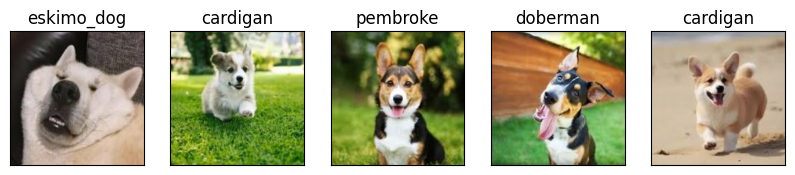

In [223]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)